Take the shared "Unigram Modeling.IPYNB" as the starting point for this assignment. It builds a unigram language model. You are required to build the bigram and the trigram language models and submit the notebook with all the outputs.

Take a corpus realdonaldtrump.csv. Take the tweets out. Remove any links and do the following:

1) Split your data into 80% training and 20% test sets.

2) Remove punctuation marks. But as the full stop is the sentence marker, keep it in the text in case you need to tokenize sentences. (See "Unigram Modeling.IPYNB")


3) Remove the newline characters.

4) Remove stopwords.

5) Use the n-grams module from nltk.util package to build bigrams and trigrams.

6) Find the frequencies of bigrams and trigrams in the corpus. Tabulate them and show the histogram. Compare it with Zipf's Law.

7) Do Add-1 smoothing (Laplace) as explained in the slides.

8) Build a dictionary showing bigram and trigram probabilities against each sorted in increasing order.

9) Retabulate the reconstituted counts for the bigrams and the trigrams.

10) Redo the histogram and compare it again with Zipf's Law.

11) Take a four-word string as the test sample and find both its unigram, bigram, and trigram perplexities.

12) Natural Langauge Generation Task: Based on step 7, build CDF (Cumulative Distribution Function). Generate a random number and compare it with the CDF. Pick the word whose CDF value is closest to it and return it as the generated text.

13) Build the Shannon game as discussed in the class. Predict the last word (hide it during prediction time) of the tweets in the test set based on one word before (Bigram modeling), and two words before (trigram modeling), and evaluate the results using accuracy.

In [1]:
import nltk

In [2]:
import spacy

In [3]:
from nltk import word_tokenize, sent_tokenize

In [4]:
import string

In [5]:
import pandas as pd

In [6]:
data = pd.read_excel("realdonaldtrump.xlsx")

In [7]:
data

,id,link,content,date,retweets,favorites,mentions,hashtags
0,1.698309e+09,https://twitter.com/realDonaldTrump/status/169...,Be sure to tune in and watch Donald Trump on L...,2009-05-04 13:54:25,510.0,917.0,NaN,NaN
1,1.701461e+09,https://twitter.com/realDonaldTrump/status/170...,Donald Trump will be appearing on The View tom...,2009-05-04 20:00:10,34.0,267.0,NaN,NaN
2,1.737480e+09,https://twitter.com/realDonaldTrump/status/173...,Donald Trump reads Top Ten Financial Tips on L...,2009-05-08 08:38:08,13.0,19.0,NaN,NaN
3,1.741161e+09,https://twitter.com/realDonaldTrump/status/174...,New Blog Post: Celebrity Apprentice Finale and...,2009-05-08 15:40:15,11.0,26.0,NaN,NaN
4,1.773561e+09,https://twitter.com/realDonaldTrump/status/177...,"""My persona will never be that of a wallflower...",2009-05-12 09:07:28,1375.0,1945.0,NaN,NaN
...,...,...,...,...,...,...,...,...
43347,1.273405e+18,https://twitter.com/realDonaldTrump/status/127...,Joe Biden was a TOTAL FAILURE in Government. H...,2020-06-17 19:00:32,23402.0,116377.0,NaN,NaN
43348,1.273408e+18,https://twitter.com/realDonaldTrump/status/127...,Will be interviewed on @ seanhannity tonight a...,2020-06-17 19:11:47,11810.0,56659.0,@seanhannity,NaN
43349,1.273442e+18,https://twitter.com/realDonaldTrump/status/127...,pic.twitter.com/3lm1spbU8X,2020-06-17 21:27:33,4959.0,19344.0,NaN,NaN
43350,1.273442e+18,https://twitter.com/realDonaldTrump/status/127...,pic.twitter.com/vpCE5MadUz,2020-06-17 21:28:38,4627.0,17022.0,NaN,NaN


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43352 entries, 0 to 43351
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   id         43352 non-null  float64       
 1   link       43352 non-null  object        
 2   content    43352 non-null  object        
 3   date       43352 non-null  datetime64[ns]
 4   retweets   43352 non-null  float64       
 5   favorites  43352 non-null  float64       
 6   mentions   20386 non-null  object        
 7   hashtags   5583 non-null   object        
dtypes: datetime64[ns](1), float64(3), object(4)
memory usage: 2.6+ MB


In [9]:
data.shape

(43352, 8)

In [10]:
data.content

0        Be sure to tune in and watch Donald Trump on L...
1        Donald Trump will be appearing on The View tom...
2        Donald Trump reads Top Ten Financial Tips on L...
3        New Blog Post: Celebrity Apprentice Finale and...
4        "My persona will never be that of a wallflower...
                               ...                        
43347    Joe Biden was a TOTAL FAILURE in Government. H...
43348    Will be interviewed on @ seanhannity tonight a...
43349                           pic.twitter.com/3lm1spbU8X
43350                           pic.twitter.com/vpCE5MadUz
43351                           pic.twitter.com/VLlc0BHW41
Name: content, Length: 43352, dtype: object

In [11]:
data1 = data['content'].replace(r'http\S+', '', regex=True)

In [12]:
data1[6]

'Listen to an interview with Donald Trump discussing his new book, Think Like A Champion: '

In [13]:
data.content[6]

'Listen to an interview with Donald Trump discussing his new book, Think Like A Champion: http://tinyurl.com/qs24vl'

In [14]:
data1

0        Be sure to tune in and watch Donald Trump on L...
1        Donald Trump will be appearing on The View tom...
2        Donald Trump reads Top Ten Financial Tips on L...
3        New Blog Post: Celebrity Apprentice Finale and...
4        "My persona will never be that of a wallflower...
                               ...                        
43347    Joe Biden was a TOTAL FAILURE in Government. H...
43348    Will be interviewed on @ seanhannity tonight a...
43349                           pic.twitter.com/3lm1spbU8X
43350                           pic.twitter.com/vpCE5MadUz
43351                           pic.twitter.com/VLlc0BHW41
Name: content, Length: 43352, dtype: object

## 1) Split your data into 80% training and 20% test sets.

In [15]:
from sklearn.model_selection import train_test_split

In [16]:
train,test = train_test_split(data1, test_size=.2,shuffle=False)

In [17]:
print(train.shape)
test.shape

(34681,)


(8671,)

In [18]:
train

0        Be sure to tune in and watch Donald Trump on L...
1        Donald Trump will be appearing on The View tom...
2        Donald Trump reads Top Ten Financial Tips on L...
3        New Blog Post: Celebrity Apprentice Finale and...
4        "My persona will never be that of a wallflower...
                               ...                        
34676    Informing the Republican Senators of my nomina...
34677    Many countries in NATO, which we are expected ...
34678    A recent Emerson College ePoll said that most ...
34679    The European Union makes it impossible for our...
34680    Just talked with Pfizer CEO and @ SecAzar on o...
Name: content, Length: 34681, dtype: object

In [19]:
test

34681    Bilateral Breakfast with NATO Secretary Genera...
34682    I am in Brussels, but always thinking about ou...
34683    ...things up, better than ever before, but it ...
34684    Democrats in Congress must no longer Obstruct ...
34685    What good is NATO if Germany is paying Russia ...
                               ...                        
43347    Joe Biden was a TOTAL FAILURE in Government. H...
43348    Will be interviewed on @ seanhannity tonight a...
43349                           pic.twitter.com/3lm1spbU8X
43350                           pic.twitter.com/vpCE5MadUz
43351                           pic.twitter.com/VLlc0BHW41
Name: content, Length: 8671, dtype: object

In [20]:
train.to_csv('train.txt', sep='\n', index=False, header=None)

In [21]:
file = open("train.txt", encoding="utf-8").read()

In [22]:
file

'Be sure to tune in and watch Donald Trump on Late Night with David Letterman as he presents the Top Ten List tonight!\nDonald Trump will be appearing on The View tomorrow morning to discuss Celebrity Apprentice and his new book Think Like A Champion!\nDonald Trump reads Top Ten Financial Tips on Late Show with David Letterman:  - Very funny!\nNew Blog Post: Celebrity Apprentice Finale and Lessons Learned Along the Way: \n"""My persona will never be that of a wallflower - I’d rather build walls than cling to them"" --Donald J. Trump"\n"Miss USA Tara Conner will not be fired - ""I\'ve always been a believer in second chances."" says Donald Trump"\nListen to an interview with Donald Trump discussing his new book, Think Like A Champion: \n"""Strive for wholeness and keep your sense of wonder intact."" --Donald J. Trump "\n"Enter the ""Think Like A Champion"" signed book and keychain contest: "\n"""When the achiever achieves, it\'s not a plateau, it’s a beginning."" --Donald J. Trump "\n""

## 2) Remove punctuation marks. But as the full stop is the sentence marker, keep it in the text in case you need to tokenize sentences. (See "Unigram Modeling.IPYNB")
## 3) Remove the newline characters.

In [23]:
string.punctuation = string.punctuation +'“'+'”'+'-'+'’'+'‘'+'—'

In [24]:
string.punctuation = string.punctuation.replace('.', '')

In [25]:
# Punctuation are symbols used for Language Formulation
file_with_nl_removed = ""
for line in file:
  line_with_nl_removed = line.replace("\n", " ")
  file_with_nl_removed += line_with_nl_removed
document = "".join([char for char in file_with_nl_removed if char not in string.punctuation])

In [26]:
document

'Be sure to tune in and watch Donald Trump on Late Night with David Letterman as he presents the Top Ten List tonight Donald Trump will be appearing on The View tomorrow morning to discuss Celebrity Apprentice and his new book Think Like A Champion Donald Trump reads Top Ten Financial Tips on Late Show with David Letterman   Very funny New Blog Post Celebrity Apprentice Finale and Lessons Learned Along the Way  My persona will never be that of a wallflower  Id rather build walls than cling to them Donald J. Trump Miss USA Tara Conner will not be fired  Ive always been a believer in second chances. says Donald Trump Listen to an interview with Donald Trump discussing his new book Think Like A Champion  Strive for wholeness and keep your sense of wonder intact. Donald J. Trump  Enter the Think Like A Champion signed book and keychain contest  When the achiever achieves its not a plateau its a beginning. Donald J. Trump  Dont be afraid of being unique  its like being afraid of your best s

## 4) Remove stopwords.

In [27]:
from nltk.corpus import stopwords

In [28]:
def remove_stopwords(text):
    new_text = []
    
    for word in text.split():
        if word in stopwords.words("english"):
            new_text.append("")
        else:
            new_text.append(word)
    x = new_text[:]
    new_text.clear()
    return " ".join(x)

In [29]:
remove_stopwords(document)

'Be sure  tune   watch Donald Trump  Late Night  David Letterman   presents  Top Ten List tonight Donald Trump   appearing  The View tomorrow morning  discuss Celebrity Apprentice   new book Think Like A Champion Donald Trump reads Top Ten Financial Tips  Late Show  David Letterman Very funny New Blog Post Celebrity Apprentice Finale  Lessons Learned Along  Way My persona  never     wallflower Id rather build walls  cling   Donald J. Trump Miss USA Tara Conner    fired Ive always   believer  second chances. says Donald Trump Listen   interview  Donald Trump discussing  new book Think Like A Champion Strive  wholeness  keep  sense  wonder intact. Donald J. Trump Enter  Think Like A Champion signed book  keychain contest When  achiever achieves    plateau   beginning. Donald J. Trump Dont  afraid   unique  like  afraid   best self. Donald J. Trump We win   lives    champions view   moment. Donald J. Trump ...these days...we could  use  little   power  Trumpative thinking. –BarnesandNoble

In [30]:
document1 = remove_stopwords(document)

In [31]:
document1

'Be sure  tune   watch Donald Trump  Late Night  David Letterman   presents  Top Ten List tonight Donald Trump   appearing  The View tomorrow morning  discuss Celebrity Apprentice   new book Think Like A Champion Donald Trump reads Top Ten Financial Tips  Late Show  David Letterman Very funny New Blog Post Celebrity Apprentice Finale  Lessons Learned Along  Way My persona  never     wallflower Id rather build walls  cling   Donald J. Trump Miss USA Tara Conner    fired Ive always   believer  second chances. says Donald Trump Listen   interview  Donald Trump discussing  new book Think Like A Champion Strive  wholeness  keep  sense  wonder intact. Donald J. Trump Enter  Think Like A Champion signed book  keychain contest When  achiever achieves    plateau   beginning. Donald J. Trump Dont  afraid   unique  like  afraid   best self. Donald J. Trump We win   lives    champions view   moment. Donald J. Trump ...these days...we could  use  little   power  Trumpative thinking. –BarnesandNoble

## 5) Use the n-grams module from nltk.util package to build bigrams and trigrams.

In [32]:
#import re 
#def ngrams(text,n):
#    text = text.lower()
#    tokens = re.split("\\s+",text)
#    ngrams = []
    
#    for i in range(len(tokens)-n+1):
#        temp = [tokens[j] for j in range (i,i+n)]
#        ngrams.append(" ".join(temp))
#    return ngrams


# unigrams = ngrams(document1,1)
# bigrams = ngrams(document1,2)
# trigrams = ngrams(document1,3)

In [33]:
import nltk
from nltk.util import ngrams

In [34]:
def extract_ngrams(text, num):
    text = text.lower()
    n_grams = ngrams(nltk.word_tokenize(text), num)
    return [ ' '.join(grams) for grams in n_grams]

In [35]:
unigrams = extract_ngrams(document1, 1)

In [36]:
bigrams = extract_ngrams(document1, 2)

In [37]:
trigrams = extract_ngrams(document1, 3)

In [38]:
unigrams

['be',
 'sure',
 'tune',
 'watch',
 'donald',
 'trump',
 'late',
 'night',
 'david',
 'letterman',
 'presents',
 'top',
 'ten',
 'list',
 'tonight',
 'donald',
 'trump',
 'appearing',
 'the',
 'view',
 'tomorrow',
 'morning',
 'discuss',
 'celebrity',
 'apprentice',
 'new',
 'book',
 'think',
 'like',
 'a',
 'champion',
 'donald',
 'trump',
 'reads',
 'top',
 'ten',
 'financial',
 'tips',
 'late',
 'show',
 'david',
 'letterman',
 'very',
 'funny',
 'new',
 'blog',
 'post',
 'celebrity',
 'apprentice',
 'finale',
 'lessons',
 'learned',
 'along',
 'way',
 'my',
 'persona',
 'never',
 'wallflower',
 'id',
 'rather',
 'build',
 'walls',
 'cling',
 'donald',
 'j.',
 'trump',
 'miss',
 'usa',
 'tara',
 'conner',
 'fired',
 'ive',
 'always',
 'believer',
 'second',
 'chances',
 '.',
 'says',
 'donald',
 'trump',
 'listen',
 'interview',
 'donald',
 'trump',
 'discussing',
 'new',
 'book',
 'think',
 'like',
 'a',
 'champion',
 'strive',
 'wholeness',
 'keep',
 'sense',
 'wonder',
 'intact',

In [39]:
bigrams

['be sure',
 'sure tune',
 'tune watch',
 'watch donald',
 'donald trump',
 'trump late',
 'late night',
 'night david',
 'david letterman',
 'letterman presents',
 'presents top',
 'top ten',
 'ten list',
 'list tonight',
 'tonight donald',
 'donald trump',
 'trump appearing',
 'appearing the',
 'the view',
 'view tomorrow',
 'tomorrow morning',
 'morning discuss',
 'discuss celebrity',
 'celebrity apprentice',
 'apprentice new',
 'new book',
 'book think',
 'think like',
 'like a',
 'a champion',
 'champion donald',
 'donald trump',
 'trump reads',
 'reads top',
 'top ten',
 'ten financial',
 'financial tips',
 'tips late',
 'late show',
 'show david',
 'david letterman',
 'letterman very',
 'very funny',
 'funny new',
 'new blog',
 'blog post',
 'post celebrity',
 'celebrity apprentice',
 'apprentice finale',
 'finale lessons',
 'lessons learned',
 'learned along',
 'along way',
 'way my',
 'my persona',
 'persona never',
 'never wallflower',
 'wallflower id',
 'id rather',
 'rather

In [40]:
trigrams

['be sure tune',
 'sure tune watch',
 'tune watch donald',
 'watch donald trump',
 'donald trump late',
 'trump late night',
 'late night david',
 'night david letterman',
 'david letterman presents',
 'letterman presents top',
 'presents top ten',
 'top ten list',
 'ten list tonight',
 'list tonight donald',
 'tonight donald trump',
 'donald trump appearing',
 'trump appearing the',
 'appearing the view',
 'the view tomorrow',
 'view tomorrow morning',
 'tomorrow morning discuss',
 'morning discuss celebrity',
 'discuss celebrity apprentice',
 'celebrity apprentice new',
 'apprentice new book',
 'new book think',
 'book think like',
 'think like a',
 'like a champion',
 'a champion donald',
 'champion donald trump',
 'donald trump reads',
 'trump reads top',
 'reads top ten',
 'top ten financial',
 'ten financial tips',
 'financial tips late',
 'tips late show',
 'late show david',
 'show david letterman',
 'david letterman very',
 'letterman very funny',
 'very funny new',
 'funny ne

## 6) Find the frequencies of bigrams and trigrams in the corpus. Tabulate them and show the histogram. Compare it with Zipf's Law.

In [41]:
import matplotlib.pyplot as plt

#### i: Find the frequencies of bigrams and trigrams in the corpus

In [42]:
fr_unigrams = nltk.FreqDist(unigrams)

In [43]:
fr_bigrams = nltk.FreqDist(bigrams)

In [44]:
fr_trigrams = nltk.FreqDist(trigrams)

#### ii: Tabulate them and show the histogram 

In [45]:
unigram_Table = pd.DataFrame(list(fr_unigrams.items()), columns = ["word","frequency"])

In [46]:
bigram_Table = pd.DataFrame(list(fr_bigrams.items()), columns = ["word","frequency"])

In [47]:
trigram_Table = pd.DataFrame(list(fr_trigrams.items()), columns = ["word","frequency"])

In [48]:
unigram_Table

,word,frequency
0,be,315
1,sure,270
2,tune,111
3,watch,622
4,donald,1742
...,...,...
40863,thai,1
40864,scotuspic.twitter.como5caavatqt,1
40865,delinquent,1
40866,epoll,1


In [49]:
bigram_Table

,word,frequency
0,be sure,71
1,sure tune,24
2,tune watch,1
3,watch donald,9
4,donald trump,1083
...,...,...
253863,applaud pfizer,1
253864,pfizer decision,1
253865,decision hope,1
253866,hope companies,1


In [50]:
trigram_Table

,word,frequency
0,be sure tune,22
1,sure tune watch,1
2,tune watch donald,1
3,watch donald trump,4
4,donald trump late,1
...,...,...
376250,pfizer decision hope,1
376251,decision hope companies,1
376252,hope companies same,1
376253,companies same .,1


In [51]:
fr_unigrams

FreqDist({'.': 29329, 'realdonaldtrump': 8576, 'i': 6913, 'great': 4679, 'trump': 4631, 'the': 3560, 'thank': 2209, '…': 2090, 'thanks': 2087, 'president': 2058, ...})

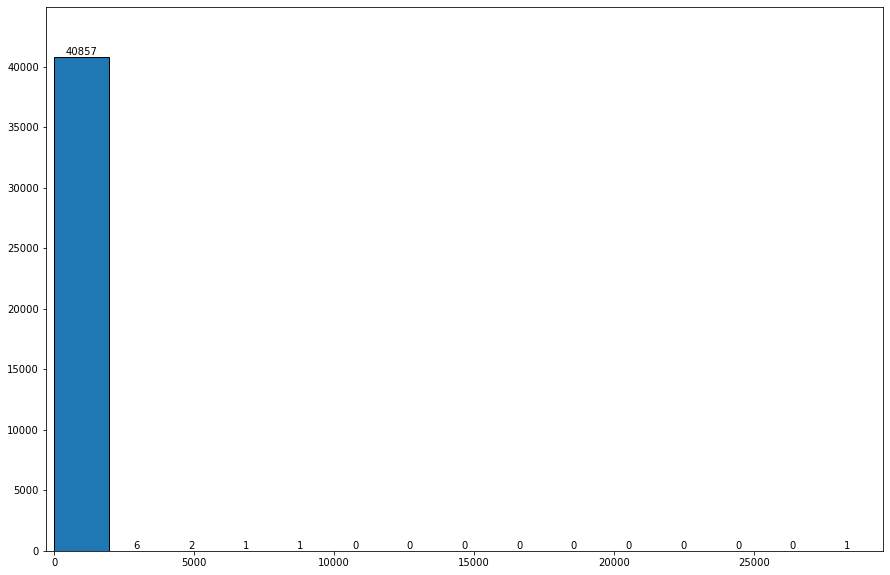

In [52]:
plt.figure(figsize=(15, 10))
values, bins, bars = plt.hist(fr_unigrams.values(),bins=15,edgecolor='black')
plt.bar_label(bars, fontsize=10, color='black')
plt.margins(x=0.01, y=0.1)
plt.show()

In [53]:
fr_bigrams

FreqDist({'. i': 1201, 'donald trump': 1083, '. the': 969, 'thanks .': 713, 'you .': 709, '. we': 681, 'thank you': 596, '. he': 592, 'realdonaldtrump i': 478, 'make america': 476, ...})

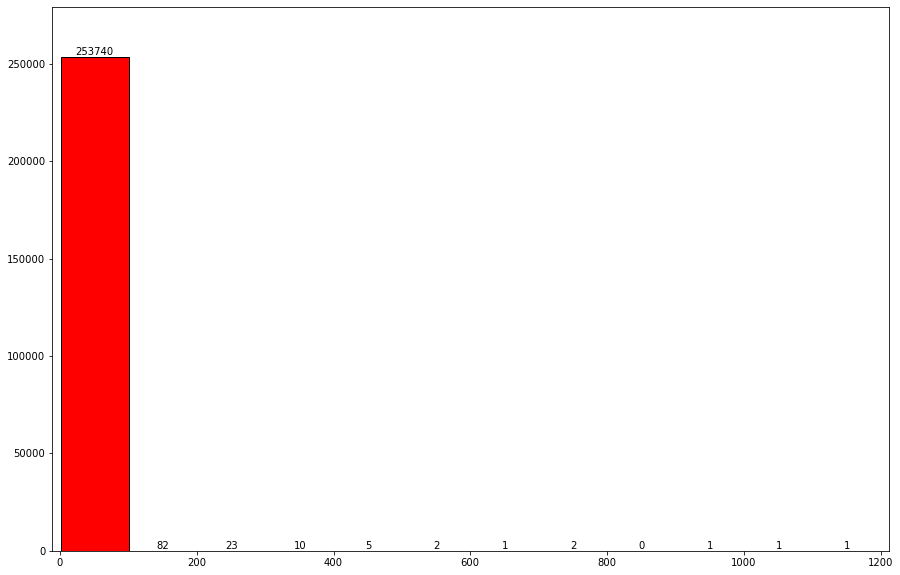

In [54]:
plt.figure(figsize=(15, 10))
values, bins, bars = plt.hist(fr_bigrams.values(),bins=12,edgecolor='black',color="r")
plt.bar_label(bars, fontsize=10, color='black')
plt.margins(x=0.01, y=0.1)
plt.show()

In [55]:
fr_trigrams

FreqDist({'thank you .': 479, 'make america great': 417, 'america great again': 354, '. we need': 134, '. thanks .': 130, '. thank you': 122, 'please run president': 98, '. – think': 95, 'the art deal': 94, 'crooked hillary clinton': 91, ...})

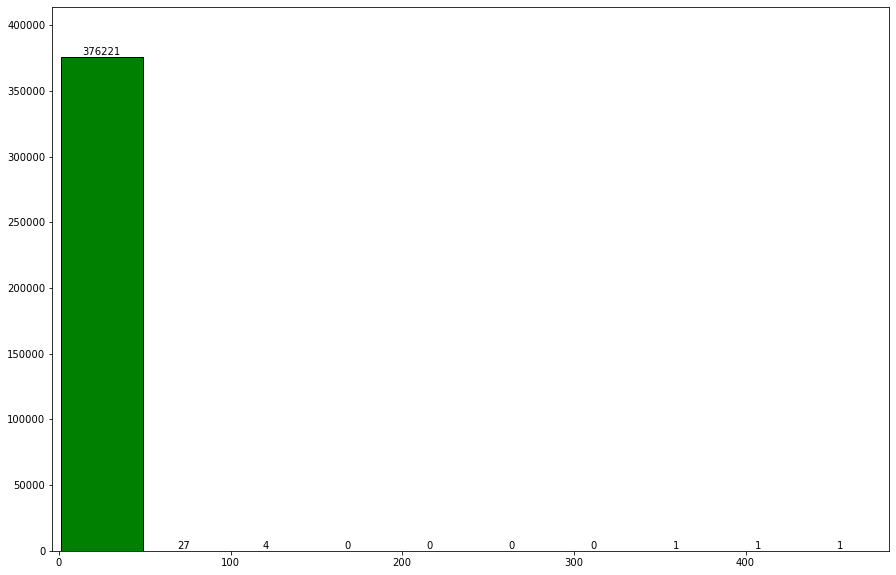

In [56]:
plt.figure(figsize=(15, 10))
values, bins, bars = plt.hist(fr_trigrams.values(),bins=10,edgecolor='black',color="g")
plt.bar_label(bars, fontsize=10, color='black')
plt.margins(x=0.01, y=0.1)
plt.show()

In [57]:
uni_ranks = []
uni_freqs = []
for uni_rank,word in enumerate(fr_unigrams):
    uni_ranks.append(uni_rank+1)
    uni_freqs.append(fr_unigrams[word])

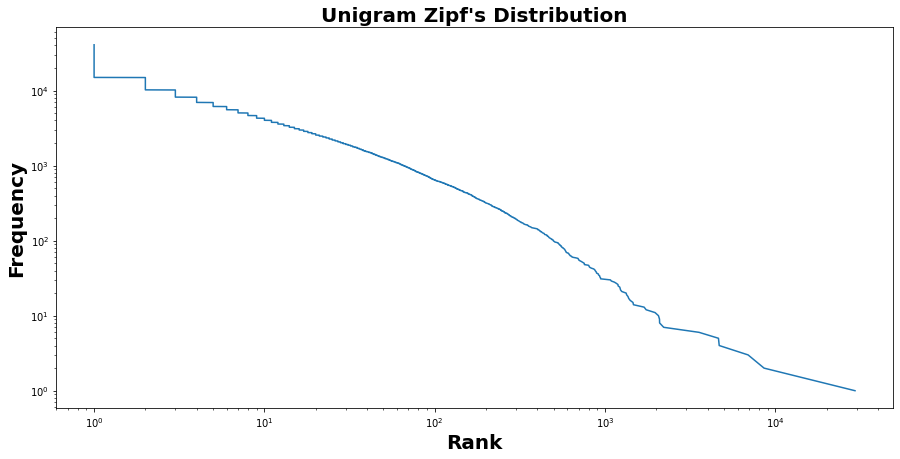

In [58]:
plt.figure(figsize=(15,7))
plt.loglog(uni_freqs,uni_ranks)
plt.xlabel('Rank',fontsize=20,fontweight="bold")
plt.ylabel('Frequency',fontsize=20,fontweight="bold")
plt.title("Unigram Zipf's Distribution",fontsize=20,fontweight="bold")
plt.show()

In [59]:
bi_ranks = []
bi_freqs = []
for bi_rank,word in enumerate(fr_bigrams):
    bi_ranks.append(bi_rank+1)
    bi_freqs.append(fr_bigrams[word])

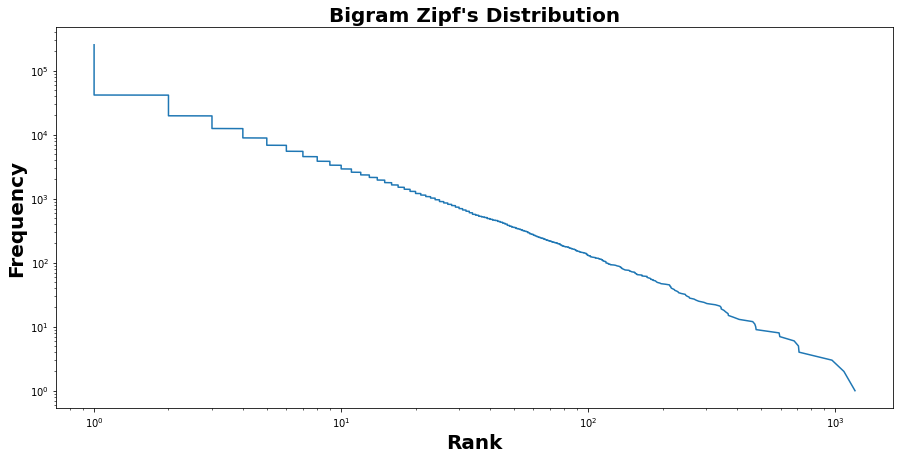

In [60]:
plt.figure(figsize=(15,7))
plt.loglog(bi_freqs,bi_ranks)
plt.xlabel('Rank',fontsize=20,fontweight="bold")
plt.ylabel('Frequency',fontsize=20,fontweight="bold")
plt.title("Bigram Zipf's Distribution",fontsize=20,fontweight="bold")
plt.show()

In [61]:
tri_ranks = []
tri_freqs = []
for tri_rank,word in enumerate(fr_trigrams):
    tri_ranks.append(tri_rank+1)
    tri_freqs.append(fr_trigrams[word])

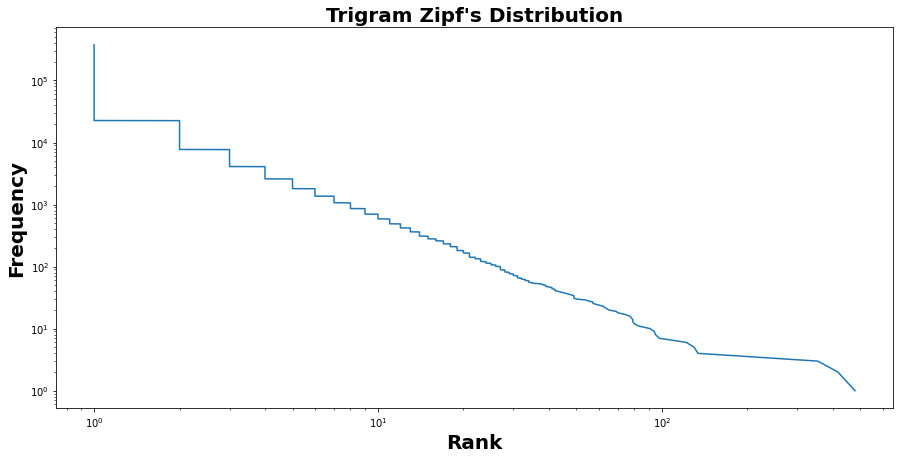

In [62]:
plt.figure(figsize=(15,7))
plt.loglog(tri_freqs,tri_ranks)
plt.xlabel('Rank',fontsize=20,fontweight="bold")
plt.ylabel('Frequency',fontsize=20,fontweight="bold")
plt.title("Trigram Zipf's Distribution",fontsize=20,fontweight="bold")
plt.show()

#### iii: Compare it with Zipf's Law

Text(0.5, 1.0, "Unigram Zipf's Distribution")

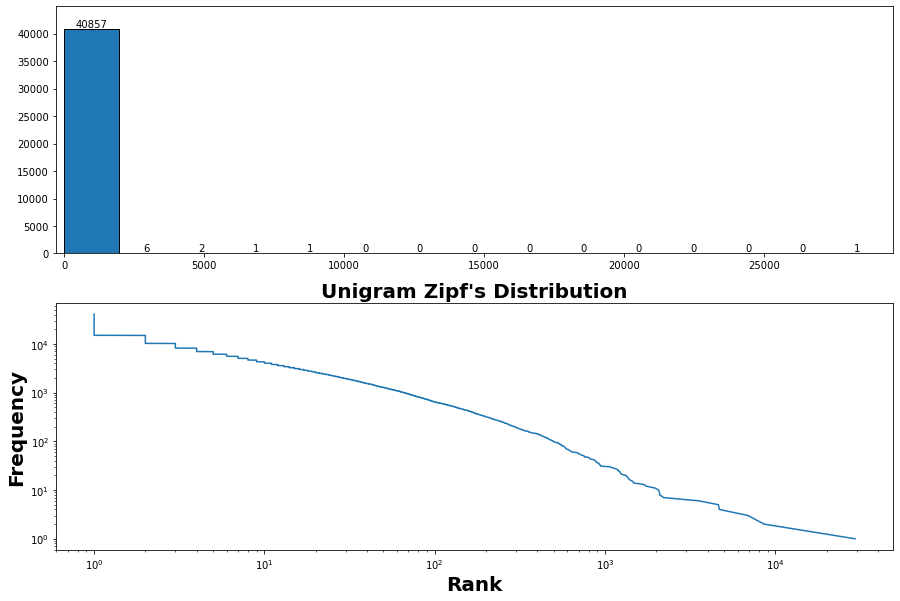

In [63]:
fig, axs = plt.subplots(2,figsize=(15, 10))
values, bins, bars = axs[0].hist(unigram_Table.frequency,bins=15,edgecolor='black')
axs[0].bar_label(bars, fontsize=10, color='black')
axs[0].margins(x=0.01, y=0.1)

axs[1].loglog(uni_freqs,uni_ranks)
axs[1].set_xlabel('Rank',fontsize=20,fontweight="bold")
axs[1].set_ylabel('Frequency',fontsize=20,fontweight="bold")
axs[1].set_title("Unigram Zipf's Distribution",fontsize=20,fontweight="bold")

Text(0.5, 1.0, "Bigram Zipf's Distribution")

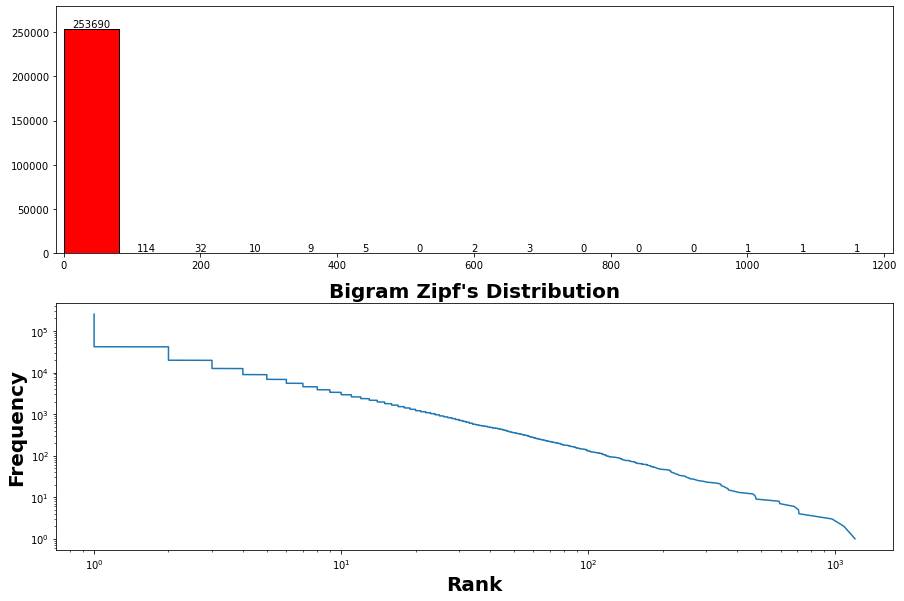

In [64]:
fig, axs = plt.subplots(2,figsize=(15, 10))
values, bins, bars = axs[0].hist(bigram_Table.frequency,bins=15,edgecolor='black',color="r")
axs[0].bar_label(bars, fontsize=10, color='black')
axs[0].margins(x=0.01, y=0.1)

axs[1].loglog(bi_freqs,bi_ranks)
axs[1].set_xlabel('Rank',fontsize=20,fontweight="bold")
axs[1].set_ylabel('Frequency',fontsize=20,fontweight="bold")
axs[1].set_title("Bigram Zipf's Distribution",fontsize=20,fontweight="bold")

Text(0.5, 1.0, "Trigram Zipf's Distribution")

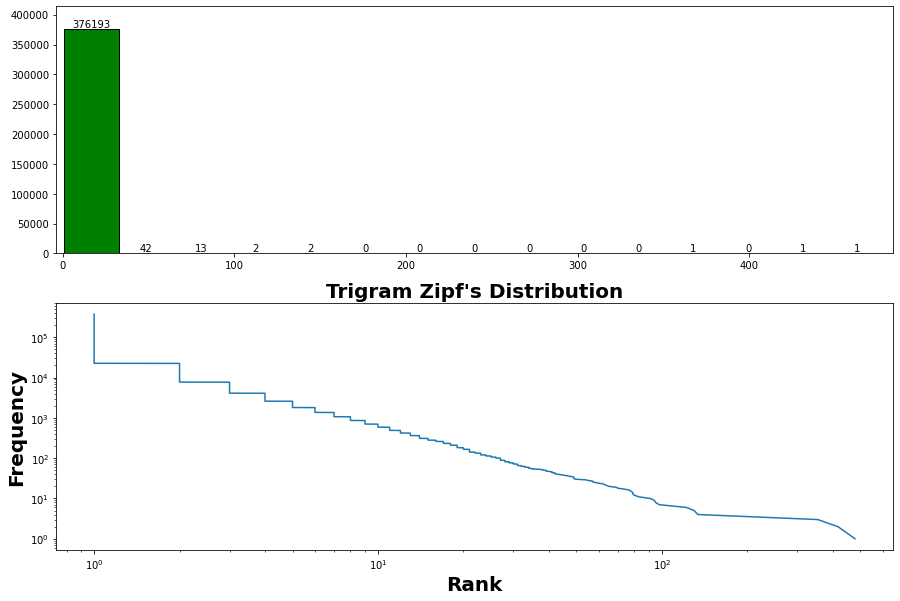

In [65]:
fig, axs = plt.subplots(2,figsize=(15, 10))
values, bins, bars = axs[0].hist(trigram_Table.frequency,bins=15,edgecolor='black',color="g")
axs[0].bar_label(bars, fontsize=10, color='black')
axs[0].margins(x=0.01, y=0.1)

axs[1].loglog(tri_freqs,tri_ranks)
axs[1].set_xlabel('Rank',fontsize=20,fontweight="bold")
axs[1].set_ylabel('Frequency',fontsize=20,fontweight="bold")
axs[1].set_title("Trigram Zipf's Distribution",fontsize=20,fontweight="bold")

## 7) Do Add-1 smoothing (Laplace) as explained in the slides.

In [66]:
fr_unigrams

FreqDist({'.': 29329, 'realdonaldtrump': 8576, 'i': 6913, 'great': 4679, 'trump': 4631, 'the': 3560, 'thank': 2209, '…': 2090, 'thanks': 2087, 'president': 2058, ...})

In [67]:
fr_unigrams_1 = nltk.FreqDist(unigrams)

In [68]:
for word in fr_unigrams_1.keys():
    fr_unigrams_1[word] += 1

In [69]:
fr_unigrams_1

FreqDist({'.': 29330, 'realdonaldtrump': 8577, 'i': 6914, 'great': 4680, 'trump': 4632, 'the': 3561, 'thank': 2210, '…': 2091, 'thanks': 2088, 'president': 2059, ...})

In [70]:
fr_bigrams

FreqDist({'. i': 1201, 'donald trump': 1083, '. the': 969, 'thanks .': 713, 'you .': 709, '. we': 681, 'thank you': 596, '. he': 592, 'realdonaldtrump i': 478, 'make america': 476, ...})

In [71]:
fr_bigrams_1 = nltk.FreqDist(bigrams)

In [72]:
for word in fr_bigrams_1.keys():
    fr_bigrams_1[word] += 1

In [73]:
fr_bigrams_1

FreqDist({'. i': 1202, 'donald trump': 1084, '. the': 970, 'thanks .': 714, 'you .': 710, '. we': 682, 'thank you': 597, '. he': 593, 'realdonaldtrump i': 479, 'make america': 477, ...})

In [74]:
fr_trigrams

FreqDist({'thank you .': 479, 'make america great': 417, 'america great again': 354, '. we need': 134, '. thanks .': 130, '. thank you': 122, 'please run president': 98, '. – think': 95, 'the art deal': 94, 'crooked hillary clinton': 91, ...})

In [75]:
fr_trigrams_1 = nltk.FreqDist(trigrams)

In [76]:
for word in fr_trigrams_1.keys():
    fr_trigrams_1[word] += 1

In [77]:
fr_trigrams_1

FreqDist({'thank you .': 480, 'make america great': 418, 'america great again': 355, '. we need': 135, '. thanks .': 131, '. thank you': 123, 'please run president': 99, '. – think': 96, 'the art deal': 95, 'crooked hillary clinton': 92, ...})

## 8) Build a dictionary showing bigram and trigram probabilities against each sorted in increasing order.

In [78]:
total_freq_uni = 0
for word in fr_unigrams_1.keys():
    total_freq_uni += fr_unigrams_1[word]

In [79]:
total_freq_uni

467037

In [80]:
unigrams_vocab = set(unigrams)

In [81]:
len(unigrams_vocab)

40868

In [82]:
prob_unigrams = {"Word":[], "Probability":[]}

In [83]:
for word in fr_unigrams_1.keys():
    probability = (fr_unigrams_1[word]/(total_freq_uni + len(unigrams_vocab)))
    prob_unigrams["Word"].append(word)
    prob_unigrams["Probability"].append(probability)

In [84]:
prob_unigrams

{'Word': ['be',
  'sure',
  'tune',
  'watch',
  'donald',
  'trump',
  'late',
  'night',
  'david',
  'letterman',
  'presents',
  'top',
  'ten',
  'list',
  'tonight',
  'appearing',
  'the',
  'view',
  'tomorrow',
  'morning',
  'discuss',
  'celebrity',
  'apprentice',
  'new',
  'book',
  'think',
  'like',
  'a',
  'champion',
  'reads',
  'financial',
  'tips',
  'show',
  'very',
  'funny',
  'blog',
  'post',
  'finale',
  'lessons',
  'learned',
  'along',
  'way',
  'my',
  'persona',
  'never',
  'wallflower',
  'id',
  'rather',
  'build',
  'walls',
  'cling',
  'j.',
  'miss',
  'usa',
  'tara',
  'conner',
  'fired',
  'ive',
  'always',
  'believer',
  'second',
  'chances',
  '.',
  'says',
  'listen',
  'interview',
  'discussing',
  'strive',
  'wholeness',
  'keep',
  'sense',
  'wonder',
  'intact',
  'enter',
  'signed',
  'keychain',
  'contest',
  'when',
  'achiever',
  'achieves',
  'plateau',
  'beginning',
  'dont',
  'afraid',
  'unique',
  'best',
  's

In [85]:
total_freq_bi = 0
for word in fr_bigrams_1.keys():
    total_freq_bi += fr_bigrams_1[word]

In [86]:
total_freq_bi

680036

In [87]:
bigrams_vocab = set(bigrams)

In [88]:
len(bigrams_vocab)

253868

In [89]:
prob_bigrams = {"Word":[], "Probability":[]}

In [90]:
for word in fr_bigrams_1.keys():
    probability = (fr_bigrams_1[word]/(total_freq_bi + len(bigrams_vocab)))
    prob_bigrams["Word"].append(word)
    prob_bigrams["Probability"].append(probability)

In [91]:
prob_bigrams

{'Word': ['be sure',
  'sure tune',
  'tune watch',
  'watch donald',
  'donald trump',
  'trump late',
  'late night',
  'night david',
  'david letterman',
  'letterman presents',
  'presents top',
  'top ten',
  'ten list',
  'list tonight',
  'tonight donald',
  'trump appearing',
  'appearing the',
  'the view',
  'view tomorrow',
  'tomorrow morning',
  'morning discuss',
  'discuss celebrity',
  'celebrity apprentice',
  'apprentice new',
  'new book',
  'book think',
  'think like',
  'like a',
  'a champion',
  'champion donald',
  'trump reads',
  'reads top',
  'ten financial',
  'financial tips',
  'tips late',
  'late show',
  'show david',
  'letterman very',
  'very funny',
  'funny new',
  'new blog',
  'blog post',
  'post celebrity',
  'apprentice finale',
  'finale lessons',
  'lessons learned',
  'learned along',
  'along way',
  'way my',
  'my persona',
  'persona never',
  'never wallflower',
  'wallflower id',
  'id rather',
  'rather build',
  'build walls',
  

In [92]:
total_freq_tri = 0
for word in fr_trigrams_1.keys():
    total_freq_tri += fr_trigrams_1[word]

In [93]:
total_freq_tri

802422

In [94]:
trigrams_vocab = set(trigrams)

In [95]:
len(trigrams_vocab)

376255

In [96]:
prob_trigrams = {"Word":[], "Probability":[]}

In [97]:
for word in fr_trigrams_1.keys():
    probability = (fr_trigrams_1[word]/(total_freq_tri + len(trigrams_vocab)))
    prob_trigrams["Word"].append(word)
    prob_trigrams["Probability"].append(probability)

In [98]:
prob_trigrams

{'Word': ['be sure tune',
  'sure tune watch',
  'tune watch donald',
  'watch donald trump',
  'donald trump late',
  'trump late night',
  'late night david',
  'night david letterman',
  'david letterman presents',
  'letterman presents top',
  'presents top ten',
  'top ten list',
  'ten list tonight',
  'list tonight donald',
  'tonight donald trump',
  'donald trump appearing',
  'trump appearing the',
  'appearing the view',
  'the view tomorrow',
  'view tomorrow morning',
  'tomorrow morning discuss',
  'morning discuss celebrity',
  'discuss celebrity apprentice',
  'celebrity apprentice new',
  'apprentice new book',
  'new book think',
  'book think like',
  'think like a',
  'like a champion',
  'a champion donald',
  'champion donald trump',
  'donald trump reads',
  'trump reads top',
  'reads top ten',
  'top ten financial',
  'ten financial tips',
  'financial tips late',
  'tips late show',
  'late show david',
  'show david letterman',
  'david letterman very',
  'le

In [99]:
unigram_dict =dict(zip(prob_unigrams["Word"], prob_unigrams["Probability"]))

In [100]:
bigram_dict = dict(zip(prob_bigrams["Word"], prob_bigrams["Probability"]))

In [101]:
trigram_dict = dict(zip(prob_trigrams["Word"], prob_trigrams["Probability"]))

In [102]:
sorted_unigram_dict = dict(sorted(unigram_dict.items(), key=lambda item: item[1]))

In [103]:
sorted_bigram_dict = dict(sorted(bigram_dict.items(), key=lambda item: item[1]))

In [104]:
sorted_trigram_dict = dict(sorted(trigram_dict.items(), key=lambda item: item[1]))

In [105]:
unigram_dict

{'be': 0.0006221635935854146,
 'sure': 0.000533564347663441,
 'tune': 0.0002205136787391343,
 'watch': 0.0012266073379864344,
 'donald': 0.003431744125377777,
 'trump': 0.009119815713568482,
 'late': 0.00017719849184394718,
 'night': 0.0010375956133528907,
 'david': 0.00018310510823874544,
 'letterman': 0.00016538525905435071,
 'presents': 2.5595337710792373e-05,
 'top': 0.000509937882084248,
 'ten': 4.922180328998533e-05,
 'list': 0.0001456965377383566,
 'tonight': 0.001252202675697227,
 'appearing': 2.362646557919296e-05,
 'the': 0.007011153660625511,
 'view': 0.00015357202626475425,
 'tomorrow': 0.0007540780264025753,
 'morning': 0.0006024748722694204,
 'discuss': 0.00011419458363276597,
 'celebrity': 0.0005611285575058328,
 'apprentice': 0.0009647473444837125,
 'new': 0.0027111369252123922,
 'book': 0.0005512841968478358,
 'think': 0.0017227631151494867,
 'like': 0.0026363197842116143,
 'a': 0.0017995491282818638,
 'champion': 0.0003110817967927073,
 'reads': 1.771984918439472e-05,

In [106]:
sorted_unigram_dict

{'wallflower': 3.937744263198826e-06,
 'cling': 3.937744263198826e-06,
 'tara': 3.937744263198826e-06,
 'achiever': 3.937744263198826e-06,
 'achieves': 3.937744263198826e-06,
 'trumpative': 3.937744263198826e-06,
 '–barnesandnoble.com': 3.937744263198826e-06,
 'igoogle': 3.937744263198826e-06,
 'thoughtful': 3.937744263198826e-06,
 'fb': 3.937744263198826e-06,
 'urls': 3.937744263198826e-06,
 'beckham': 3.937744263198826e-06,
 'britney': 3.937744263198826e-06,
 'spears': 3.937744263198826e-06,
 'commercialfree': 3.937744263198826e-06,
 'inexplicable': 3.937744263198826e-06,
 'randal': 3.937744263198826e-06,
 'pinkett': 3.937744263198826e-06,
 'bookkeychain': 3.937744263198826e-06,
 'browse': 3.937744263198826e-06,
 'stuf': 3.937744263198826e-06,
 'hysterical': 3.937744263198826e-06,
 'dsrl': 3.937744263198826e-06,
 'lick': 3.937744263198826e-06,
 'sweepstakes': 3.937744263198826e-06,
 'executeyou': 3.937744263198826e-06,
 'wneil': 3.937744263198826e-06,
 'jareds': 3.937744263198826e-06

In [107]:
bigram_dict

{'be sure': 7.709571861775942e-05,
 'sure tune': 2.6769346742277578e-05,
 'tune watch': 2.1415477393822065e-06,
 'watch donald': 1.0707738696911031e-05,
 'donald trump': 0.001160718874745156,
 'trump late': 4.283095478764413e-06,
 'late night': 1.4990834175675445e-05,
 'night david': 3.2123216090733095e-06,
 'david letterman': 2.355702513320427e-05,
 'letterman presents': 2.1415477393822065e-06,
 'presents top': 2.1415477393822065e-06,
 'top ten': 6.424643218146619e-06,
 'ten list': 3.2123216090733095e-06,
 'list tonight': 2.1415477393822065e-06,
 'tonight donald': 5.3538693484555156e-06,
 'trump appearing': 3.2123216090733095e-06,
 'appearing the': 3.2123216090733095e-06,
 'the view': 2.1415477393822062e-05,
 'view tomorrow': 4.283095478764413e-06,
 'tomorrow morning': 5.3538693484555156e-05,
 'morning discuss': 2.1415477393822065e-06,
 'discuss celebrity': 2.1415477393822065e-06,
 'celebrity apprentice': 0.00023985334681080712,
 'apprentice new': 2.1415477393822065e-06,
 'new book': 

In [108]:
sorted_bigram_dict

{'tune watch': 2.1415477393822065e-06,
 'letterman presents': 2.1415477393822065e-06,
 'presents top': 2.1415477393822065e-06,
 'list tonight': 2.1415477393822065e-06,
 'morning discuss': 2.1415477393822065e-06,
 'discuss celebrity': 2.1415477393822065e-06,
 'apprentice new': 2.1415477393822065e-06,
 'trump reads': 2.1415477393822065e-06,
 'reads top': 2.1415477393822065e-06,
 'ten financial': 2.1415477393822065e-06,
 'financial tips': 2.1415477393822065e-06,
 'tips late': 2.1415477393822065e-06,
 'letterman very': 2.1415477393822065e-06,
 'very funny': 2.1415477393822065e-06,
 'funny new': 2.1415477393822065e-06,
 'new blog': 2.1415477393822065e-06,
 'blog post': 2.1415477393822065e-06,
 'post celebrity': 2.1415477393822065e-06,
 'apprentice finale': 2.1415477393822065e-06,
 'finale lessons': 2.1415477393822065e-06,
 'lessons learned': 2.1415477393822065e-06,
 'learned along': 2.1415477393822065e-06,
 'way my': 2.1415477393822065e-06,
 'my persona': 2.1415477393822065e-06,
 'persona n

In [109]:
trigram_dict

{'be sure tune': 1.9513403587242308e-05,
 'sure tune watch': 1.6968177032384613e-06,
 'tune watch donald': 1.6968177032384613e-06,
 'watch donald trump': 4.242044258096154e-06,
 'donald trump late': 1.6968177032384613e-06,
 'trump late night': 1.6968177032384613e-06,
 'late night david': 1.6968177032384613e-06,
 'night david letterman': 2.545226554857692e-06,
 'david letterman presents': 1.6968177032384613e-06,
 'letterman presents top': 1.6968177032384613e-06,
 'presents top ten': 1.6968177032384613e-06,
 'top ten list': 2.545226554857692e-06,
 'ten list tonight': 1.6968177032384613e-06,
 'list tonight donald': 1.6968177032384613e-06,
 'tonight donald trump': 1.6968177032384613e-06,
 'donald trump appearing': 2.545226554857692e-06,
 'trump appearing the': 1.6968177032384613e-06,
 'appearing the view': 2.545226554857692e-06,
 'the view tomorrow': 3.3936354064769226e-06,
 'view tomorrow morning': 1.6968177032384613e-06,
 'tomorrow morning discuss': 1.6968177032384613e-06,
 'morning disc

In [110]:
sorted_trigram_dict

{'sure tune watch': 1.6968177032384613e-06,
 'tune watch donald': 1.6968177032384613e-06,
 'donald trump late': 1.6968177032384613e-06,
 'trump late night': 1.6968177032384613e-06,
 'late night david': 1.6968177032384613e-06,
 'david letterman presents': 1.6968177032384613e-06,
 'letterman presents top': 1.6968177032384613e-06,
 'presents top ten': 1.6968177032384613e-06,
 'ten list tonight': 1.6968177032384613e-06,
 'list tonight donald': 1.6968177032384613e-06,
 'tonight donald trump': 1.6968177032384613e-06,
 'trump appearing the': 1.6968177032384613e-06,
 'view tomorrow morning': 1.6968177032384613e-06,
 'tomorrow morning discuss': 1.6968177032384613e-06,
 'morning discuss celebrity': 1.6968177032384613e-06,
 'discuss celebrity apprentice': 1.6968177032384613e-06,
 'celebrity apprentice new': 1.6968177032384613e-06,
 'apprentice new book': 1.6968177032384613e-06,
 'champion donald trump': 1.6968177032384613e-06,
 'donald trump reads': 1.6968177032384613e-06,
 'trump reads top': 1.6

## 9) Retabulate the reconstituted counts for the bigrams and the trigrams.

In [111]:
unigram_Table

,word,frequency
0,be,315
1,sure,270
2,tune,111
3,watch,622
4,donald,1742
...,...,...
40863,thai,1
40864,scotuspic.twitter.como5caavatqt,1
40865,delinquent,1
40866,epoll,1


In [112]:
bigram_Table

,word,frequency
0,be sure,71
1,sure tune,24
2,tune watch,1
3,watch donald,9
4,donald trump,1083
...,...,...
253863,applaud pfizer,1
253864,pfizer decision,1
253865,decision hope,1
253866,hope companies,1


In [113]:
trigram_Table

,word,frequency
0,be sure tune,22
1,sure tune watch,1
2,tune watch donald,1
3,watch donald trump,4
4,donald trump late,1
...,...,...
376250,pfizer decision hope,1
376251,decision hope companies,1
376252,hope companies same,1
376253,companies same .,1


## 10) Redo the histogram and compare it again with Zipf's Law.

#### i: Redo the histogram

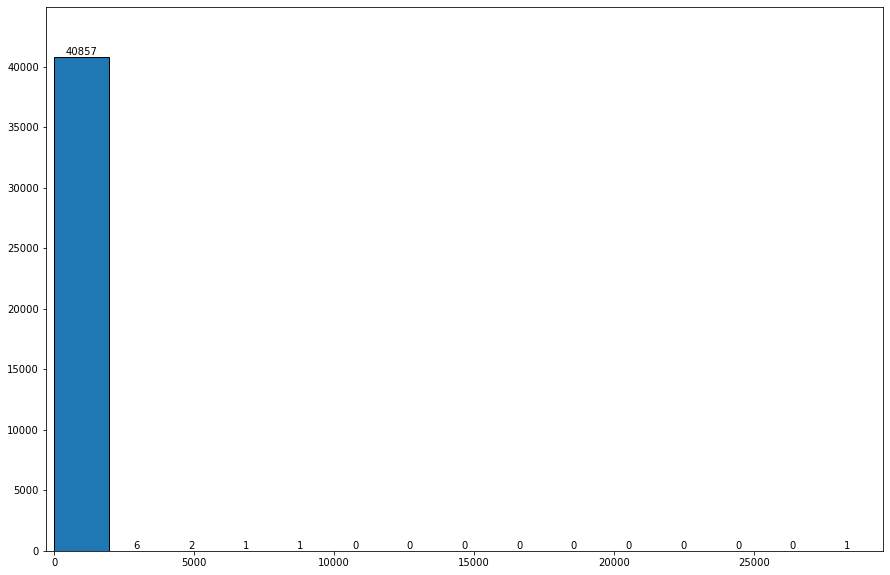

In [114]:
plt.figure(figsize=(15, 10))
values, bins, bars = plt.hist(unigram_Table.frequency,bins=15,edgecolor='black')
plt.bar_label(bars, fontsize=10, color='black')
plt.margins(x=0.01, y=0.1)
plt.show()

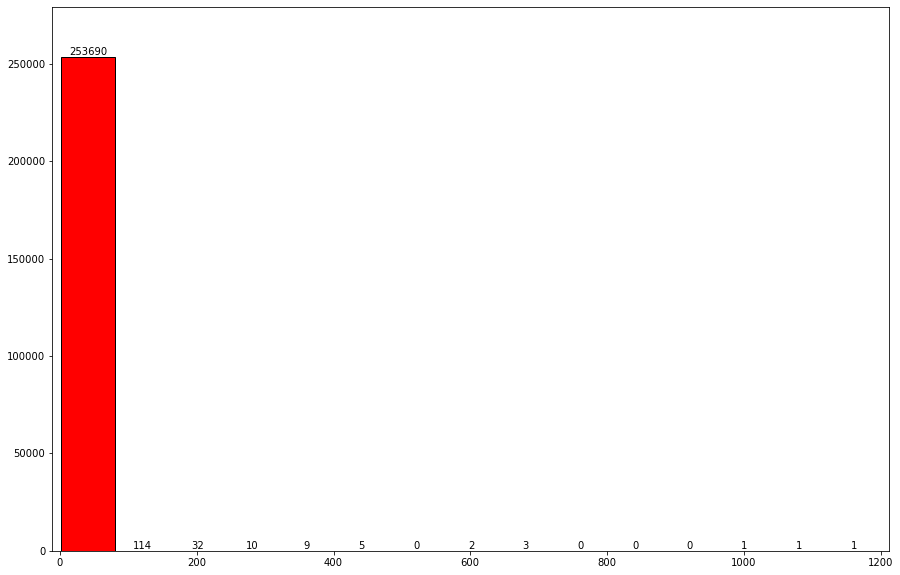

In [115]:
plt.figure(figsize=(15, 10))
values, bins, bars = plt.hist(bigram_Table.frequency,bins=15,edgecolor='black',color="r")
plt.bar_label(bars, fontsize=10, color='black')
plt.margins(x=0.01, y=0.1)
plt.show()

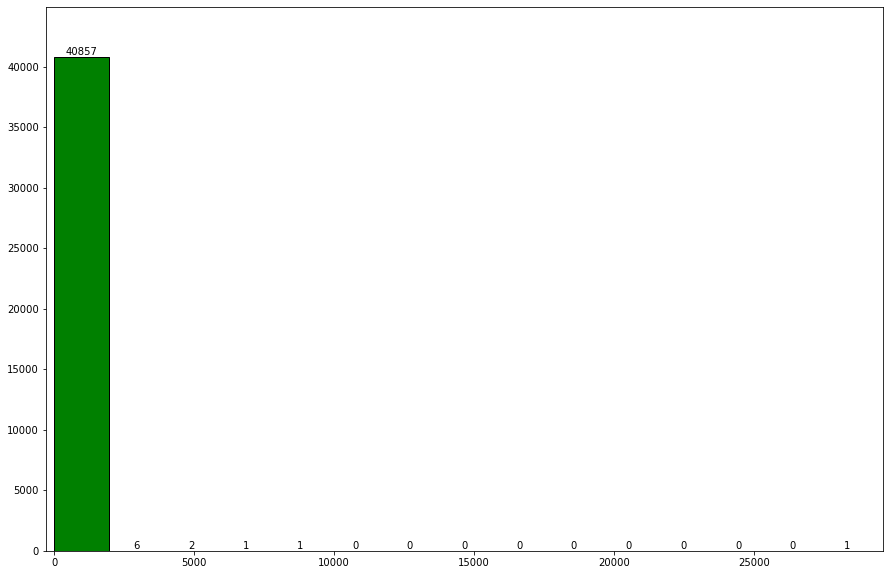

In [116]:
plt.figure(figsize=(15, 10))
values, bins, bars = plt.hist(unigram_Table.frequency,bins=15,edgecolor='black',color="g")
plt.bar_label(bars, fontsize=10, color='black')
plt.margins(x=0.01, y=0.1)
plt.show()

#### ii: compare it again with Zipf's Law

Text(0.5, 1.0, "Unigram Zipf's Distribution")

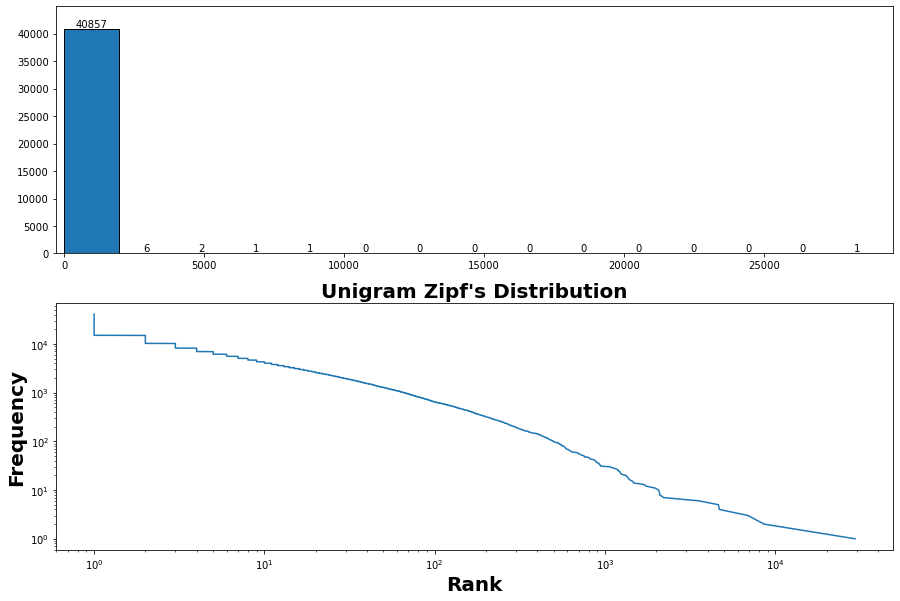

In [117]:
fig, axs = plt.subplots(2,figsize=(15, 10))
values, bins, bars = axs[0].hist(unigram_Table.frequency,bins=15,edgecolor='black')
axs[0].bar_label(bars, fontsize=10, color='black')
axs[0].margins(x=0.01, y=0.1)

axs[1].loglog(uni_freqs,uni_ranks)
axs[1].set_xlabel('Rank',fontsize=20,fontweight="bold")
axs[1].set_ylabel('Frequency',fontsize=20,fontweight="bold")
axs[1].set_title("Unigram Zipf's Distribution",fontsize=20,fontweight="bold")

Text(0.5, 1.0, "Bigram Zipf's Distribution")

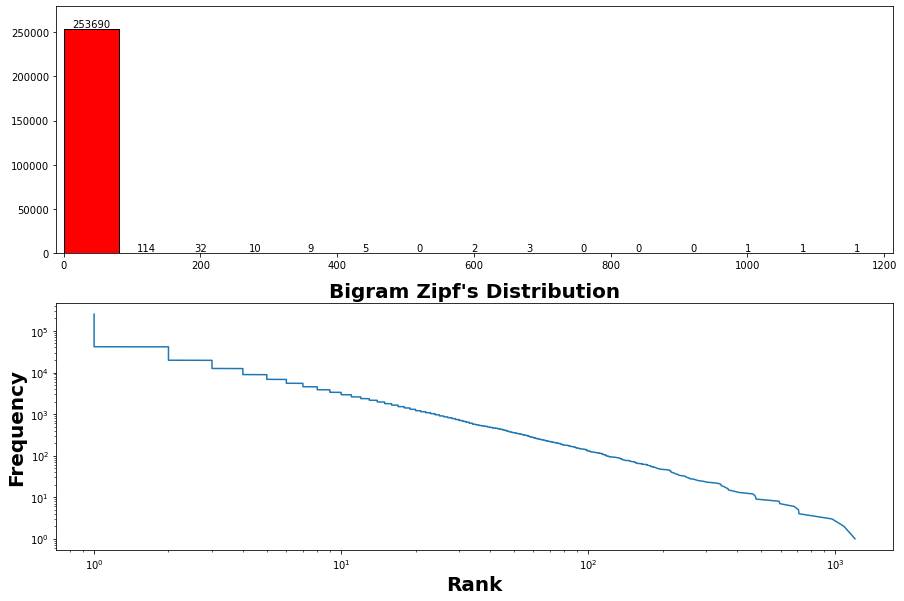

In [118]:
fig, axs = plt.subplots(2,figsize=(15, 10))
values, bins, bars = axs[0].hist(bigram_Table.frequency,bins=15,edgecolor='black',color="r")
axs[0].bar_label(bars, fontsize=10, color='black')
axs[0].margins(x=0.01, y=0.1)

axs[1].loglog(bi_freqs,bi_ranks)
axs[1].set_xlabel('Rank',fontsize=20,fontweight="bold")
axs[1].set_ylabel('Frequency',fontsize=20,fontweight="bold")
axs[1].set_title("Bigram Zipf's Distribution",fontsize=20,fontweight="bold")

Text(0.5, 1.0, "Trigram Zipf's Distribution")

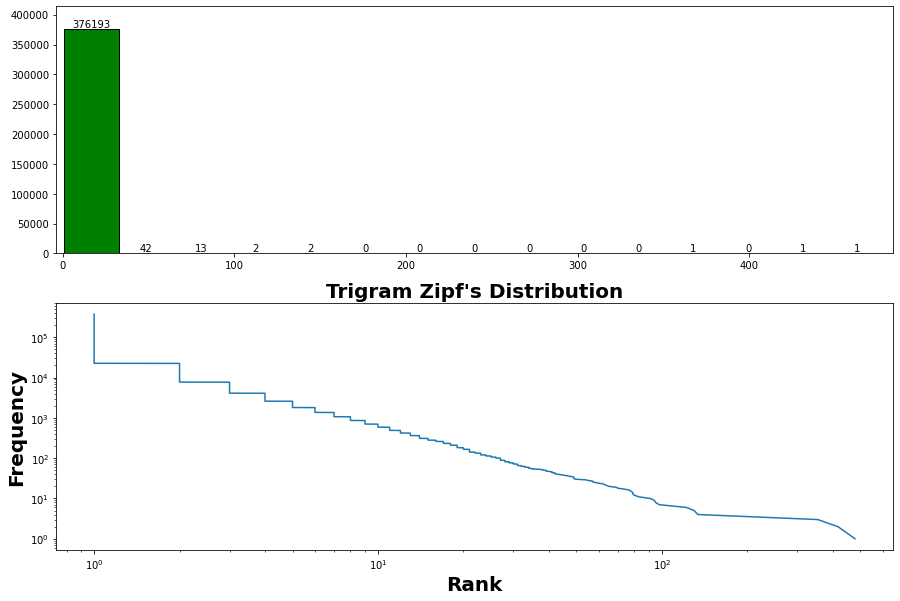

In [119]:
fig, axs = plt.subplots(2,figsize=(15, 10))
values, bins, bars = axs[0].hist(trigram_Table.frequency,bins=15,edgecolor='black',color="g")
axs[0].bar_label(bars, fontsize=10, color='black')
axs[0].margins(x=0.01, y=0.1)

axs[1].loglog(tri_freqs,tri_ranks)
axs[1].set_xlabel('Rank',fontsize=20,fontweight="bold")
axs[1].set_ylabel('Frequency',fontsize=20,fontweight="bold")
axs[1].set_title("Trigram Zipf's Distribution",fontsize=20,fontweight="bold")

## 11) Take a four-word string as the test sample and find both its unigram, bigram, and trigram perplexities.

## 12) Natural Langauge Generation Task: Based on step 7, build CDF (Cumulative Distribution Function). Generate a random number and compare it with the CDF. Pick the word whose CDF value is closest to it and return it as the generated text.

In [120]:
unigram_Table_1 = pd.DataFrame(list(fr_unigrams_1.items()), columns = ["word","frequency"])

In [121]:
bigram_Table_1 = pd.DataFrame(list(fr_bigrams_1.items()), columns = ["word","frequency"])

In [122]:
trigram_Table_1 = pd.DataFrame(list(fr_trigrams_1.items()), columns = ["word","frequency"])

In [123]:
df1 = pd.DataFrame()

In [124]:
df1['pdf'] = (unigram_Table_1.frequency / sum(unigram_Table_1.frequency))

# CDF
df1['cdf'] = df1['pdf'].cumsum()
df1 = df1.reset_index(drop=True)
df1

,pdf,cdf
0,0.000677,0.000677
1,0.000580,0.001257
2,0.000240,0.001497
3,0.001334,0.002831
4,0.003732,0.006563
...,...,...
40863,0.000004,0.999983
40864,0.000004,0.999987
40865,0.000004,0.999991
40866,0.000004,0.999996


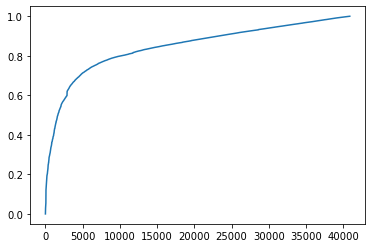

In [125]:
plt.plot(df1['cdf'])

In [126]:
df2 = pd.DataFrame()

In [127]:
df2['pdf'] = (bigram_Table_1.frequency / sum(bigram_Table_1.frequency))

# CDF
df2['cdf'] = df2['pdf'].cumsum()
df2 = df2.reset_index(drop=True)
df2

,pdf,cdf
0,0.000106,0.000106
1,0.000037,0.000143
2,0.000003,0.000146
3,0.000015,0.000160
4,0.001594,0.001754
...,...,...
253863,0.000003,0.999988
253864,0.000003,0.999991
253865,0.000003,0.999994
253866,0.000003,0.999997


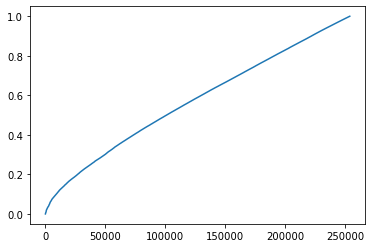

In [128]:
plt.plot(df2['cdf'])

In [129]:
df3 = pd.DataFrame()

In [130]:
df3['pdf'] = (trigram_Table_1.frequency / sum(trigram_Table_1.frequency))

# CDF
df3['cdf'] = df3['pdf'].cumsum()
df3 = df3.reset_index(drop=True)
df3

,pdf,cdf
0,0.000029,0.000029
1,0.000002,0.000031
2,0.000002,0.000034
3,0.000006,0.000040
4,0.000002,0.000042
...,...,...
376250,0.000002,0.999990
376251,0.000002,0.999993
376252,0.000002,0.999995
376253,0.000002,0.999998


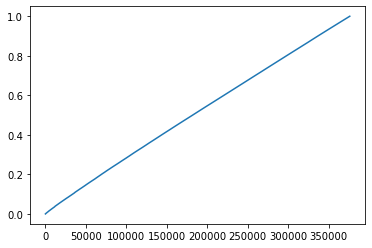

In [131]:
plt.plot(df3['cdf'])

## 13) Build the Shannon game as discussed in the class. Predict the last word (hide it during prediction time) of the tweets in the test set based on one word before (Bigram modeling), and two words before (trigram modeling), and evaluate the results using accuracy.